In [41]:
import cv2
import tensorflow as tf
import imutils
from imutils.object_detection import non_max_suppression
import matplotlib.pyplot as plt
import os
import pandas as pd
import numpy as np
from deskew import determine_skew
import face_recognition
import time
import keras
import pickle
import shutil
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from easyocr import Reader
from difflib import SequenceMatcher
import json
import random

In [2]:
def init():
    readerLatin = Reader(["en"], gpu=True)
    readerArabic = Reader(["ar"], gpu=True)
    readermix = Reader(["ar","en"], gpu=True)
    return (readerLatin,readerArabic,readermix )

In [3]:
(readerLatin,readerArabic,readermix ) = init()
svm_bar_classifier = pickle.load(open("assets/models/svm_bar_classifier", 'rb'))

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


In [4]:
import numpy as np
import cv2
from skimage import measure
import imutils
import matplotlib.pyplot as plt


def pred(score):
    pred_class = "" #defining variable to store predictions
    if score[0][0] <0.3: #CNN model refers to 0 as "glare" and 1 as "not glare", applying a threshold for both cases.
        pred_class = "Glare" #values less than 0.5
    else:
        pred_class = "Not Glare" #values greater than 0.5
    return pred_class

def create_mask(image):
    gray = cv2.cvtColor( image, cv2.COLOR_BGR2GRAY )
    blurred = cv2.GaussianBlur( gray, (9,9), 0 )
    _,thresh_img = cv2.threshold( blurred, 240, 255, cv2.THRESH_BINARY)
    thresh_img = cv2.erode( thresh_img, None, iterations=2 )
    thresh_img  = cv2.dilate( thresh_img, None, iterations=4 )
    labels = measure.label( thresh_img, background=0)
    mask = np.zeros( thresh_img.shape, dtype="uint8" )
    for label in np.unique( labels ):
        # if this is the background label, ignore it
        if label == 0:
            continue
        
        labelMask = np.zeros( thresh_img.shape, dtype="uint8" )
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero( labelMask )
        if numPixels > 500:
            mask = cv2.add( mask, labelMask )
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = [cv2.boundingRect(c) for c in cnts]
    cnts = [(x,y,x+w,y+h) for (x, y, w, h) in cnts]
    

    return cnts

def rcnn_glare(im,cnts):
    image = im.copy()
    boxes = []
    for c in cnts:
        (startX, startY, endX, endY) = c
        clip = image[startY:endY,startX:endX]
        clip = cv2.resize(clip, (64,64), interpolation = cv2.INTER_AREA)
        clip = np.expand_dims(clip, axis = 0) 
        result = glareCNN.predict(clip/255,verbose = 0)
        p = pred(result)
        if p == "Glare":
            boxes.append(c)
    return (boxes,image)

im = cv2.imread("testing4 (3).jpg")
c = create_mask(im)

In [29]:
def face_detect_rotate(image):
    trials = 0
    while(trials<4):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        face_locations = face_recognition.face_locations(gray)
        if(len(face_locations)>0):
            main_face = max(face_locations,key = lambda x : abs(x[0] - x[2]) * abs(x[1] - x[3]))
            right= main_face[1]
            bottom = main_face[2]
            return (right,bottom,image)
        else : 
            image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE) 
            trials += 1
    return 0
def traditional_processing(image,kw,kh,ishow = False):
    if ishow:
        show(image,"original")
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kw, kh))
    if ishow:
        show(gray,"gray scale")
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    if ishow:
        show(gray,"bluring")
    gray = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    if ishow:
        show(gray,"black hat")
    gray = cv2.Sobel(gray, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
    if ishow:
        show(gray,"sobel")
    grad = np.absolute(gray)
    if ishow:
        show(grad,"absolute")
    (minVal, maxVal) = (np.min(grad), np.max(grad))
    grad = (grad - minVal) / (maxVal - minVal)
    grad = (grad * 255).astype("uint8")
    if ishow:
        show(grad,"standardize")
    grad = cv2.morphologyEx(grad, cv2.MORPH_CLOSE, kernel)
    if ishow:
        show(grad,"closing op")
    thresh = cv2.threshold(grad, 0, 255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
    if ishow:
        show(thresh,"thresholding")
    thresh = cv2.dilate(thresh, None, iterations=3)
    if ishow:
        show(thresh,"dilation")
    return thresh

def show(image,text = ""):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    fig = plt.figure(figsize=(10, 10))
    rows = 1
    columns = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(image)
    plt.title(text)
    plt.axis('off')
def show2(im1,im2):
    fig = plt.figure(figsize=(15, 10))
    rows = 1
    columns = 2
    fig.add_subplot(rows, columns, 1)
    plt.imshow(im1)
    plt.title("image1")
    plt.axis('off')
    fig.add_subplot(rows, columns, 2)
    plt.imshow(im2)
    plt.title("image1")
    plt.axis('off')
def drawROIs(image,boxes,color):
    im = image.copy()
    if color == "red":
        color = (255,0,0)
    elif color == "blue":
        color = (0,0,255)
    elif color == "green":
        color = (0,255,0)
    else : 
        color = (0,0,0)
    for box in boxes:
        (startX, startY, endX, endY) = box
        cv2.rectangle(im,(startX, startY),(endX, endY),color,2)
    return im

def top_slash_coordinates(image,boxes):
    boxes = sorted(boxes,key=lambda x : x[1])
    message = "REPUBLIC OF TUNISIA"
    for box in boxes:
        (startX, startY, endX, endY) = box
        clip = image[startY:endY,startX:endX]
        results = readerLatin.readtext(clip)
        texts = [res[1] for res in results]
        text="".join(texts)
        if SequenceMatcher(None, text, message).ratio()>0.5:
            return endY
    return -1
def increase_contrast(img):
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)
    limg = cv2.merge((cl,a,b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return enhanced_img
def extract_bar(image,kw,kh,delim,left):
    original = image.copy()
    image = traditional_processing(image,kw,kh,ishow = True)
    im_h,im_w = image.shape[:2]
    cnts = cv2.findContours(image.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = [cv2.boundingRect(c) for c in cnts]
    cnts = [(x,y,x+w,y+h) for (x, y, w, h) in cnts]
    bar_position = [x for x in cnts if x[3] >delim and left<x[0]and (x[2]-x[0])> 3 * (x[3]-x[1])]
    cnts = sorted(cnts,key = lambda x : x[1])
    for c in bar_position:
        (xstart,ystart,xend,yend)= c
        clip = original[ystart:yend,xstart:xend]
        results = readerLatin.readtext(clip)
        texts = [res[1] for res in results]
        text=" ".join(texts)
        if text == "":
            clip = cv2.resize(clip, (300,70), interpolation = cv2.INTER_AREA)
            clip = clip.flatten()
            probs = svm_bar_classifier.predict_proba([clip])
            if probs[0][0]>probs[0][1]+0.5:
                break
    top = top_slash_coordinates(original,cnts)
    return (xstart,ystart,top)
def boundary_check(original,cnts):
    text = ""
    while(text==""):
        (xstart,ystart,xend,yend) = cnts[0]
        clip = original[ystart:yend,xstart:xend]
        clip = unblur(clip)
        results = readerLatin.readtext(clip)
        results = results + readerArabic.readtext(clip)
        texts = [res[1] for res in results]
        text = "".join(texts)
        if text == "" or "<" in text:
            cnts.remove(cnts[0])
    return cnts
def adjust(image):
    image = unblur(image)
    original = image.copy()
    
    image = traditional_processing(image,40,8)
    cnts = cv2.findContours(image, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = [cv2.boundingRect(c) for c in cnts]
    cnts = [(x,y,x+w,y+h) for (x, y, w, h) in cnts if w*h > 50*10*4 and w>h]
    
    #cnts = fetch_text(original,cnts)
    cnts = sorted(cnts , key = lambda x : x[0])
    cnts = boundary_check(original,cnts)
    
    cnts = sorted(cnts , key = lambda x : x[3],reverse = True)
    cnts = boundary_check(original,cnts)
    
    cnts = sorted(cnts , key = lambda x : x[1])
    cnts = boundary_check(original,cnts)
    (h,w) = image.shape[:2]
    buffer = 10
    top = max([min(cnts , key = lambda x : x[1])[1]-buffer,0])
    bottom = min([max(cnts , key = lambda x : x[3])[3]+buffer,h])
    right = min([max(cnts , key = lambda x : x[2])[2]+buffer,w])
    left = max([min(cnts , key = lambda x : x[0])[0]-buffer,0])
    final = original[top:bottom,left:right]
    return final
def unblur(image):
    kernel = np.array([[0, -1, 0],[-1, 5,-1],[0, -1, 0]])
    image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
    return image

In [6]:
def line_detection(im):
    image = im.copy()
    image = traditional_processing(image,40,8)
    cnts = cv2.findContours(image, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = [cv2.boundingRect(c) for c in cnts]
    cnts = [(x,y,x+w,y+h) for (x, y, w, h) in cnts if w*h > 50*10*4 and w>h]
    
    show(drawROIs(im,cnts,"red"))
    
    cnts = sorted(cnts , key = lambda x : x[3])
    lines = []
    line = []
    for c in cnts:
        if len(line)>0:
            y=c[3]
            y1,y2 = line[-1][1],line[-1][3]
            current_boxe_height = y2 - y1
            if y - y2 > current_boxe_height/2:
                lines.append((y2,c[1]))
                line = []
        line.append(c)
    lines = [a+b//2 for (a,b) in lines]
    w = im.shape[1]
    grid = im.copy()
    horiz = [0.15,0.5,0.75]
    vertc = lines
    for i in horiz:
        y = int( i * w )
        cv2.line(grid,(y,0),(y,h),(255,0,0),2)
    for i in vertc:
        cv2.line(grid,(0,i),(w,i),(255,0,0),2)
    show(grid)

In [52]:
def close_up(im):
    original = im.copy()
    try :
            left,bottom,im=face_detect_rotate(im)
            try : 
                (barX,barY,top) = extract_bar(im,40,8,bottom,left)
                im = im[top:barY,left:]
                (h,w) = im.shape[:2]
                if (h*w < 1024*1024):
                    im = cv2.resize(im,(1500,1000),interpolation = cv2.INTER_AREA)
                im = adjust(im)
                (h,w) = im.shape[:2]
            except Exception as e :
                print(e)
    except Exception as e:
        print(e)
    res = cv2.imread("landmarks.png")
    show(res,"landmarks detected")
    res = cv2.imread("cropped.png")
    show(res,"cropped")
    return res

In [68]:
def readValue(label,im,hybrid = False,arabic = False, date = False):
    h,w = im.shape[:2]
    ( x0 , y0 , x1 , y1 ) = locations[label]
    layout_box = ( int(x0*w) , int(y0*h) , int(x1*w) , int(y1*h) )
    (startX, startY , endX, endY) = layout_box
    clip = im[startY: endY,startX:endX]
    #boxes=model_based_ROI_extraction(clip)
    #plt.imshow(drawROIs(im,boxes,"clip"))
    #plt.show()
    ch = clip.shape[0]/3
    if arabic == True :
        results = readerArabic.readtext(clip)
        results = sorted(results,key = lambda x : x[0][2][0],reverse = True)
        texts = [res[1] for res in results if res[0][2][1] - res[0][0][1] > ch]
    else :
        if hybrid == True :
            texts = [res[1] for res in readermix.readtext(clip) if res[0][2][1] - res[0][0][1] > ch]
            if len(texts) > 1 :
                texts = [t for t in texts if " / " in t]
        else :
            if date ==True:
                texts = [res[1] for res in readermix.readtext(clip) if res[0][2][1] - res[0][0][1] > ch]
                texts = [t for t in texts if "-" in t and len(t)==10]
            else :
                texts = [res[1] for res in readerLatin.readtext(clip) if res[0][2][1] - res[0][0][1] > ch]
                if label == "national ID":
                    texts = [t for t in texts if len(t)==8 and t.isnumeric()]
                if label == "passport ID":
                    texts = [t for t in texts]# if t[0].isupper() and t[1:7].isnumeric() ]
                if label in ["name","surname"]:
                    texts = [t for t in texts if t[0].isupper()]
    text = " ".join(texts)
    return text
def text_results_easyocr(im):
    increase_contrast(im)
    show(show_grid(im))
    res = {}
    for label in locations:
        break
        if label in ["arabic name","job","adresse"]:
            text = readValue(label,im,arabic = True)
        else : 
            if label in ["nationality","sex","birth place","issue auth"]:
                text = readValue(label,im,hybrid = True)
            else : 
                if label in ["birth date","issue date","expr date"]:
                    text = readValue(label,im,date = True)
                else : 
                    text = readValue(label,im)
        res[label] = text
    time.sleep(random.randint(5,10))
    results = {
    "passport ID": "A000000",
    "arabic name": "غسان بن حبيب بحروني",
    "surname": "CITIZEN",
    "name": "JOHN",
    "job": "طالب",
    "nationality": "TUNISIAN/تونسي",
    "birth date": "00-00-0000",
    "national ID": "00000000",
    "adresse": "KAIRouAn7القيروان",
    "sex": "Mذكر",
    "birth place": "HAFFOUZ/حفوز",
    "issue date": "00-00-0000",
    "issue auth": "00-00-0000",
    "expr date": "00-00-0000",
    "signature": "KAIRouAn7 Jyi Dmd"
    }
    return results

In [9]:
def area(x1,y1,x2,y2):
    return (x2-x1)*(y2-y1)

def iou(target,box):
    (sx1, sy1 , ex1, ey1) = target
    a1 = area(sx1, sy1 , ex1, ey1)
    (sx2, sy2 , ex2, ey2) = box
    a2 = area(sx2, sy2 , ex2, ey2)
    
    isx = max(sx1,sx2)
    isy = max(sy1,sy2)
    iex = min(ex1,ex2)
    iey = min(ey1,ey2)
    h = max(0 , (iex-isx) )
    w = max(0 , (iey-isy) )
    i = h*w
    
    u = a1 + a2 -i
    return i/u,(isx,isy,iex,iey),i

def detect_flash(image,text_boxes):
    cnts = create_mask(image)
    flash_boxes,viz = rcnn_glare(image,cnts)
    inters = []
    flash = False
    for target in flash_boxes:
        for box in text_boxes:
            a , c ,i = iou(target,box)
            if a > 0.1:
                inters.append(c)
                flash = True
    viz = drawROIs(viz,inters,"blue")
    return flash,viz

In [10]:
relative_path = "../Docs/dataset"
passport_list = os.listdir(relative_path)
passport_list = [p for p in passport_list if p[-4:]==".jpg" or p[-4:]==".png"]

In [11]:
glareCNN = tf.keras.models.load_model('image-quality-cnn/model/glare/glare_detect.h5')

In [12]:
i = passport_list[10]

In [34]:
def unblur(image):
    kernel = np.array([[0, -1, 0],[-1, 5,-1],[0, -1, 0]])
    image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
    return image

def increase_contrast(img):
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)
    limg = cv2.merge((cl,a,b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    show(enhanced_img,"SRCNN & contrast enhacement")
    return enhanced_img

In [14]:
locations = {
    "passport ID" : ( 0.5 , 0 , 0.75 , 0.12 ) ,
    "arabic name" : ( 0 , 0.12 , 1 , 0.23 ) ,
    "surname"     : ( 0 , 0.23 , 0.5 , 0.34 ) ,
    "name"        : ( 0 , 0.34 , 0.5 , 0.45 ) ,
    "job"         : ( 0.5 , 0.45 , 1 , 0.57 ) ,
    "nationality" : ( 0 , 0.45 , 0.5 , 0.57 ) ,
    "birth date"  : ( 0 , 0.57 , 0.5 , 0.68 ) ,
    "national ID" : ( 0.5 , 0.57 , 0.75 , 0.68 ) ,
    "adresse"     : ( 0.75 , 0.57 , 1 , 0.68 ) ,
    "sex"         : ( 0 , 0.68 , 0.15 , 0.79 ) ,
    "birth place" : ( 0.15 , 0.68 , 1 , 0.79 ) ,
    "issue date"  : ( 0 , 0.79 , 0.5 , 0.9 ) ,
    "issue auth"  : ( 0.5 , 0.79 , 1 , 0.9 ) ,
    "expr date"   : ( 0 , 0.9 , 0.5 , 1 ) ,
}

In [ ]:
start = time.time()
im_path = "test.png"
im = cv2.imread(im_path)
im = close_up(im)
end = time.time()
print("elapsed time before ocr: ", end - start)
start = time.time()
object_dict = text_results_easyocr(im)
print("results : " ,json.dumps(object_dict, indent=4,ensure_ascii = False))
print("ocr time : ", time.time() - start)

In [66]:
def show_grid(test):
    h,w = test.shape[:2]
    grid = test.copy()
    horiz = [0.15,0.5,0.7,0.9]
    vertc = [0.12,0.25,0.350,0.45,0.55,0.65,0.75,0.9]
    for i in horiz:
        y = int( i * w )
        cv2.line(grid,(y,0),(y,h),(0,0,255),1)
    for i in vertc:
        x = int( i * h )
        cv2.line(grid,(0,x),(w,x),(0,0,255),1)
    return grid

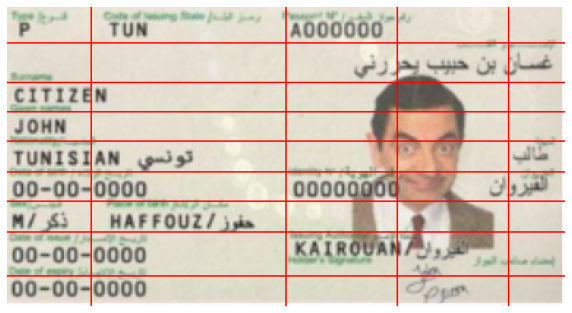

In [67]:
show(show_grid(im))

In [44]:
def decode_predictions(scores, geometry,min_confidence):
    (numRows, numCols) = scores.shape[2:4]
    rects = []
    confidences = []
    for y in range(0, numRows):
        scoresData = scores[0, 0, y]
        xData0 = geometry[0, 0, y]
        xData1 = geometry[0, 1, y]
        xData2 = geometry[0, 2, y]
        xData3 = geometry[0, 3, y]
        anglesData = geometry[0, 4, y]
        for x in range(0, numCols):
            if scoresData[x] < min_confidence:
                continue
            
            (offsetX, offsetY) = (x * 4.0, y * 4.0)
            
            angle = anglesData[x]
            cos = np.cos(angle)
            sin = np.sin(angle)
            
            h = xData0[x] + xData2[x]
            w = xData1[x] + xData3[x]
            endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
            endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
            startX = int(endX - w)
            startY = int(endY - h)
            rects.append((startX, startY, endX, endY))
            confidences.append(scoresData[x])
    return (rects, confidences)
def model_based_ROI_extraction(image):
    layerNames = ["feature_fusion/Conv_7/Sigmoid","feature_fusion/concat_3"]
    net = cv2.dnn.readNet(east_path)
    height,width = image.shape[:2]
    blob = cv2.dnn.blobFromImage(image, 1.0, (width, height),(128, 128, 128), swapRB=True, crop=False)
    net.setInput(blob)
    (scores, geometry) = net.forward(layerNames)
    (rects, confidences) = decode_predictions(scores, geometry,min_confidence)
    #boxes = non_max_suppression(np.array(rects), probs=confidences)
    return boxes
current = os.getcwd()
east_path = os.path.join(current,"assets/models/frozen_east_text_detection.pb")
min_confidence = 0.5

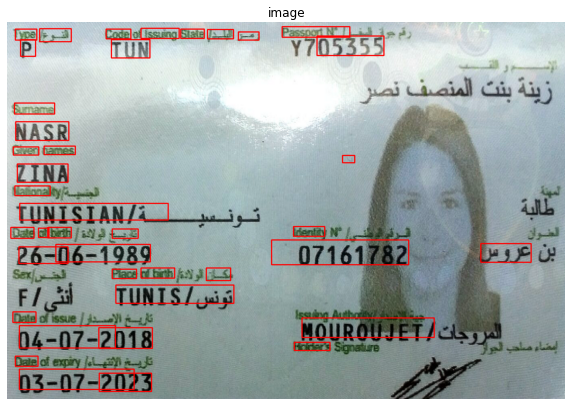

In [29]:
from skimage import io
from skimage.color import rgb2gray
from skimage.transform import rotate
from deskew import determine_skew
from skimage.util import img_as_float

def deskew_image(image):
    im = img_as_float(image)
    grayscale = rgb2gray(im)
    h,w = grayscale.shape[:2]
    grayscale = grayscale[:h//2,:w//2]
    angle = determine_skew(grayscale)
    rotated = rotate(im, angle, resize=True) 
    return rotated

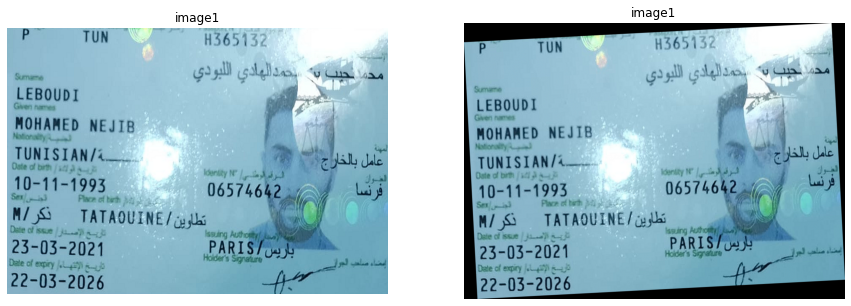

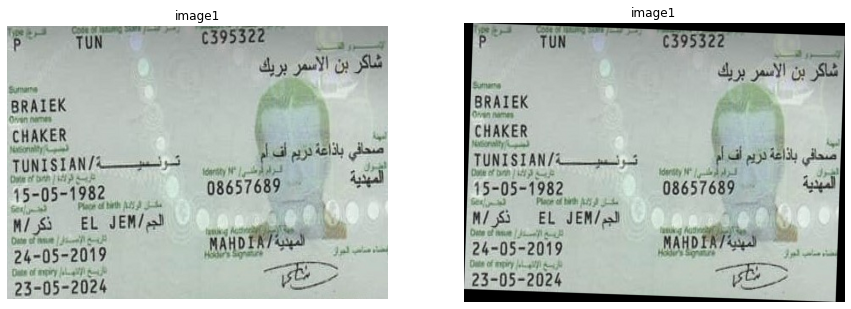

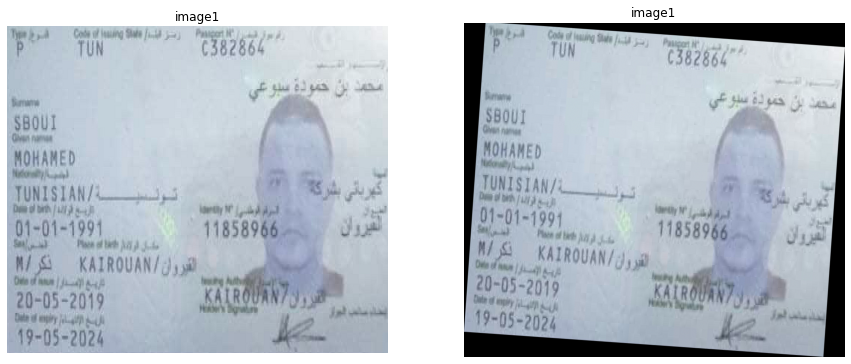

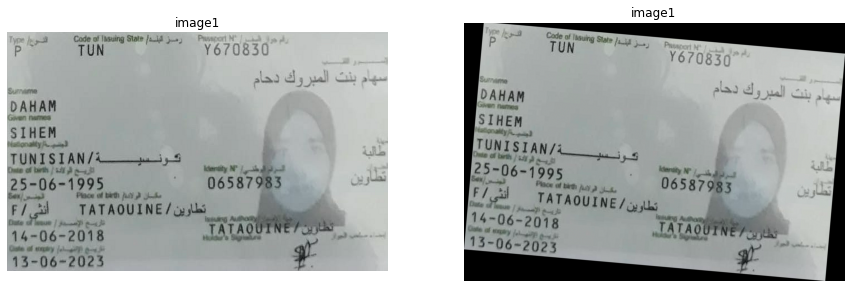

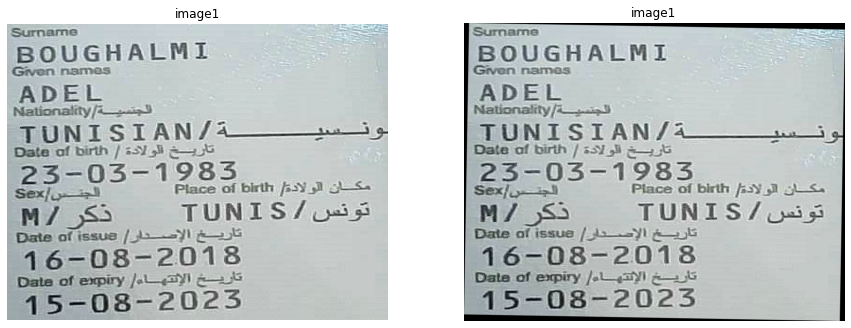

...

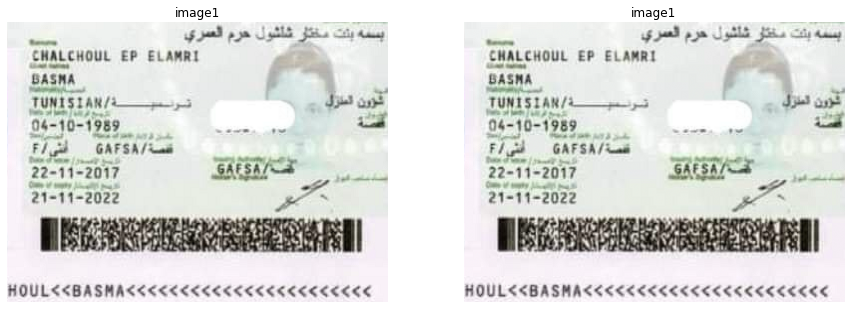

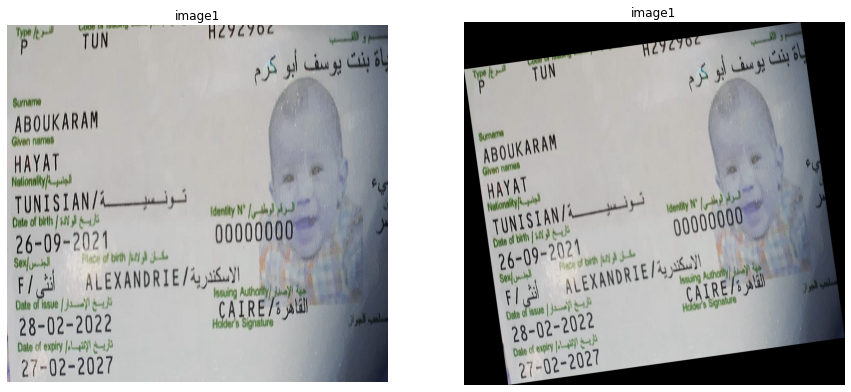

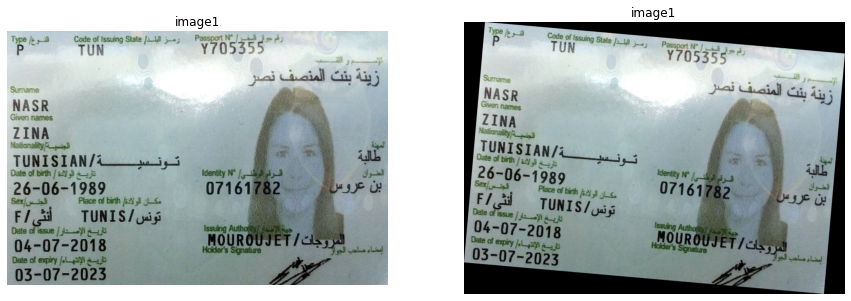

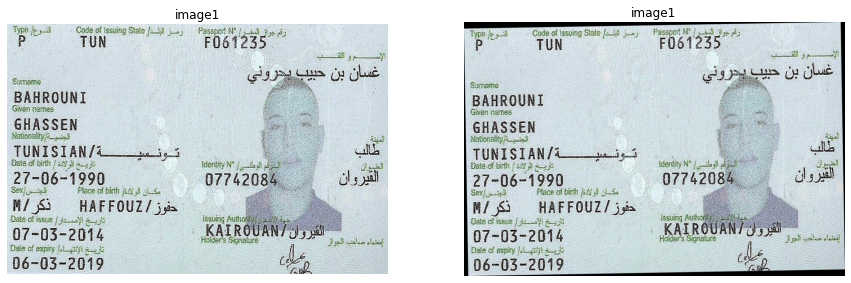

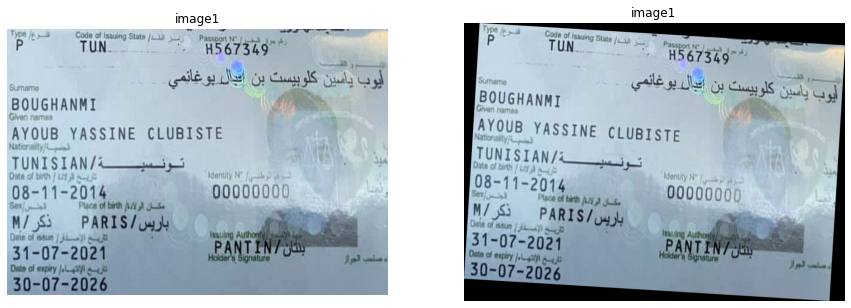

In [30]:
for i in passport_list:
    im_path = os.path.join(relative_path,i)
    im = cv2.imread(im_path)
    im = close_up(im)
    orig = im.copy()
    im =  deskew_image(im)
    show2(orig,im)

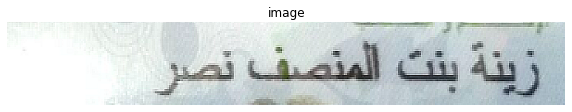

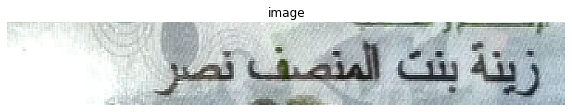

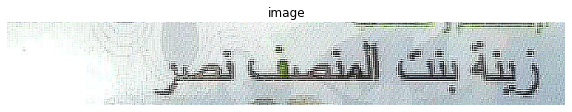

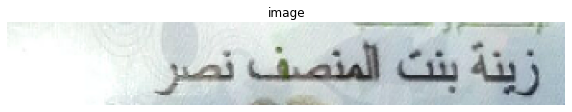

In [30]:
def increase_contrast(img):
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)
    limg = cv2.merge((cl,a,b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return enhanced_img
def unblur(image):
    kernel = np.array([[0, -1, 0],[-1, 5,-1],[0, -1, 0]])
    image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
    return image
h1=int(h* 0.12)
w2=int(w*0.5)
h2 = int(h* 0.23 ) 
h,w = im.shape[:2]
subject = im[h1:h2,w2:]
h,w = subject.shape[:2]
contrasted = increase_contrast(subject)
unblured = unblur(subject)
big = cv2.resize(subject,(2*w,2*h),interpolation= cv2.INTER_AREA)
small = cv2.resize(big,(int(0.5*w),int(0.5*h)),interpolation = cv2.INTER_AREA)
blurred = cv2.resize(small,(w,h),interpolation = cv2.INTER_AREA)
show(subject)
show(contrasted)
show(unblured)
show(blurred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


elapsed time before ocr:  9.898485898971558
results :  {
    "passport ID": "A000000",
    "arabic name": "غسان بن حبيب بحروني",
    "surname": "CITIZEN",
    "name": "JOHN",
    "job": "طالب",
    "nationality": "TUNISIAN/تونسي",
    "birth date": "00-00-0000",
    "national ID": "00000000",
    "adresse": "KAIRouAn7القيروان",
    "sex": "Mذكر",
    "birth place": "HAFFOUZ/حفوز",
    "issue date": "00-00-0000",
    "issue auth": "00-00-0000",
    "expr date": "00-00-0000",
    "signature": "KAIRouAn7 Jyi Dmd"
}
ocr time :  10.03271222114563


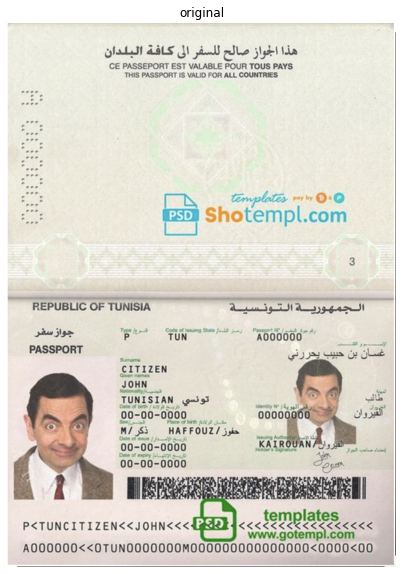

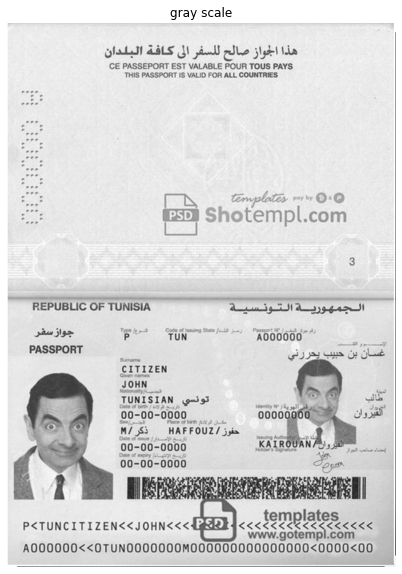

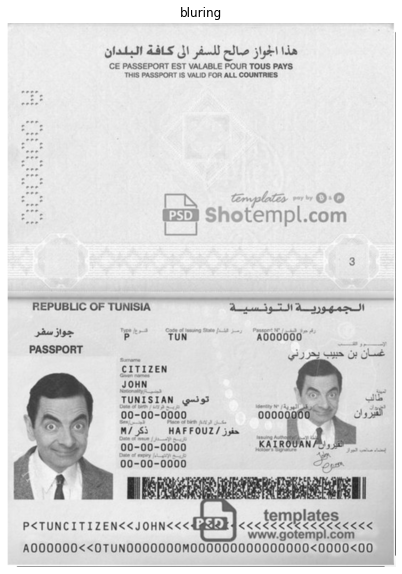

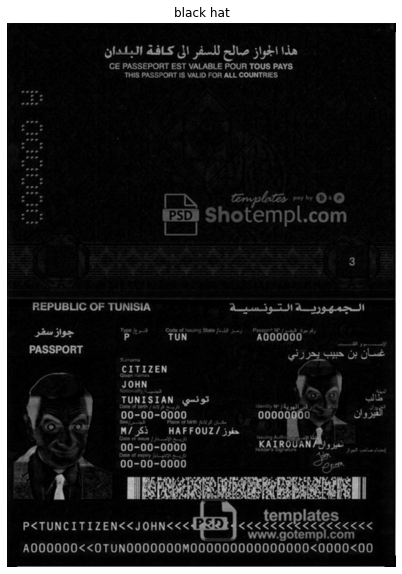

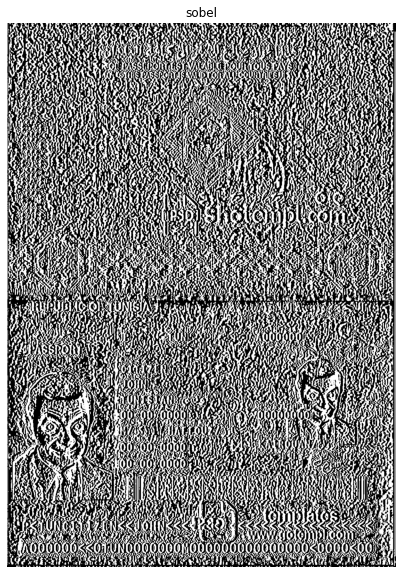

...

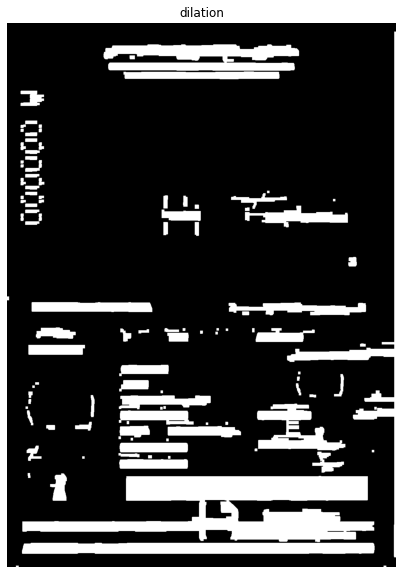

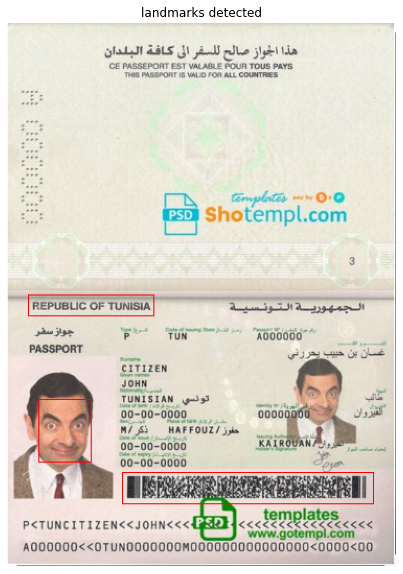

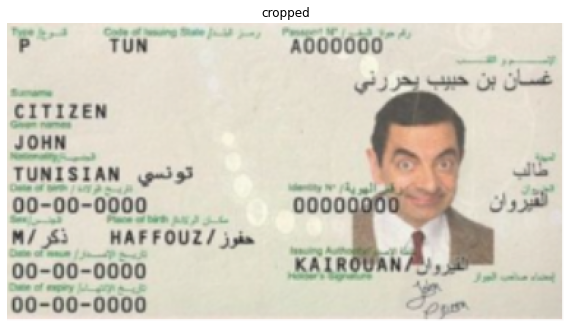

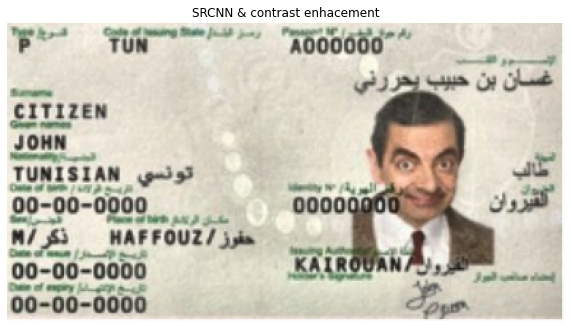

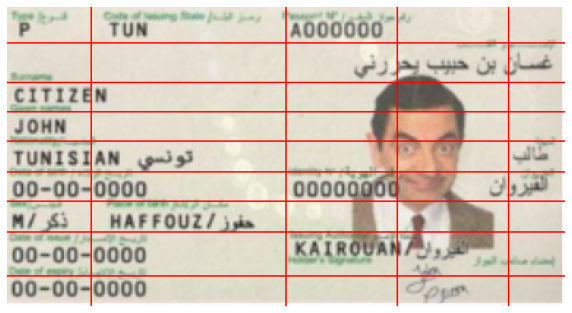

In [70]:
start = time.time()
im_path = "test.png"
im = cv2.imread(im_path)
im = close_up(im)
end = time.time()
print("elapsed time before ocr: ", end - start)
start = time.time()
object_dict = text_results_easyocr(im)
print("results : " ,json.dumps(object_dict, indent=4,ensure_ascii = False))
print("ocr time : ", time.time() - start)